# Importing Required Libraries

In [24]:
import pandas as pd                              # Data Manipulation
import numpy as np                               # Numeric Calculation
import matplotlib.pyplot as plt                  # Data Visualization                    
import seaborn as sns                            # Advance Data Visualization
import mysql.connector as sql                    # for SQL connection
from sklearn.compose import ColumnTransformer    
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler 
import warnings                                   # Warnings 
warnings.filterwarnings('ignore')
import pickle, joblib
%matplotlib inline       

In [2]:
# Creating Connection between Python and MySQL

data = sql.connect(host = "localhost",
                   user = "Mohd Bilal",
                   password = "12345", 
                   database = "solar_project"
)

In [3]:
sql_query = "SELECT * FROM solar_project.max_solar_data"

In [25]:
# Loading Dataset from MySQL database. 

solar = pd.read_sql(sql_query,data)

In [5]:
solar

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf,label
0,0.000041,2.369843,90.429688,147.949219,0.616820,-0.530396,-0.160283,-146.003418,120.255127,25.595601,1.000000,50.000000,1.000000,50.000000,F0M
1,0.010040,2.378357,90.368652,148.242188,-0.678956,0.570679,0.047847,148.546906,-119.881439,-24.723663,1.000000,50.000000,1.000000,50.000000,F0M
2,0.020039,2.373627,90.460205,148.535156,0.603393,-0.537109,-0.187139,-145.027008,120.315399,26.109924,1.000000,50.000000,1.000000,50.000000,F0M
3,0.030038,2.368896,90.423584,148.242188,-0.685670,0.570679,0.041133,147.341461,-119.736786,-26.105906,0.440380,50.078491,118.275197,49.921509,F0M
4,0.040037,2.362274,90.435791,148.242188,0.630248,-0.523682,-0.166997,-143.279114,120.942230,26.680501,0.618996,50.248673,90.022162,49.606494,F0M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10696,14.353236,2.363220,87.280273,145.019531,0.542968,-0.718384,0.161982,-125.233612,143.013916,-18.270518,0.700222,49.837684,155.419819,49.997678,F7M
10697,14.363235,2.308350,86.737061,145.312500,-0.631959,0.590820,-0.005864,126.101532,-142.121887,18.503571,0.696735,49.979017,155.409061,50.000249,F7M
10698,14.373234,2.341461,87.103271,145.312500,0.536254,-0.711670,0.168696,-124.751434,142.893372,-18.073629,0.692128,50.219535,155.370171,50.000483,F7M
10699,14.383233,2.426605,87.011719,145.312500,-0.625245,0.584106,0.000850,125.438538,-143.050079,18.379008,0.690443,50.113452,155.363070,49.999983,F7M


In [ ]:

# 	Time: Time in seconds, average sampling T_s=9.9989 μs.
# 	Ipv: PV array current measurement. 
# 	Vpv: PV array voltage measurement.  
# 	Vdc: DC voltage measurement. 
# 	ia, ib, ic: 3-Phase current measurements. 
# 	va, vb, vc: 3-Phase voltage measurements.
# 	Iabc: Current magnitude.  
# 	If: Current frequency.
# 	Vabc: Voltage magnitude.  
# 	Vf: Voltage frequency.
    

## Auto EDA

In [29]:
import pandas_profiling as p

p.ProfileReport(solar)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
solar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10701 entries, 0 to 10700
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Time    10701 non-null  float64
 1   Ipv     10701 non-null  float64
 2   Vpv     10701 non-null  float64
 3   Vdc     10701 non-null  float64
 4   ia      10701 non-null  float64
 5   ib      10701 non-null  float64
 6   ic      10701 non-null  float64
 7   va      10701 non-null  float64
 8   vb      10701 non-null  float64
 9   vc      10701 non-null  float64
 10  Iabc    10701 non-null  float64
 11  If      10701 non-null  float64
 12  Vabc    10701 non-null  float64
 13  Vf      10701 non-null  float64
 14  label   10701 non-null  object 
dtypes: float64(14), object(1)
memory usage: 1.2+ MB


In [28]:
# now check if there are any null values in data set 

solar.isnull().sum()

Time     0
Ipv      0
Vpv      0
Vdc      0
ia       0
ib       0
ic       0
va       0
vb       0
vc       0
Iabc     0
If       0
Vabc     0
Vf       0
label    0
dtype: int64

In [7]:
# Describe function gives description of dataset only for numeric columns. 

solar.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,10701.0,6.906892,4.122059,0.000041,3.345901,6.687954,10.466189,14.397664
Ipv,10701.0,2.129741,0.571346,-0.561005,2.140900,2.286591,2.390656,3.557129
Vpv,10701.0,80.743282,25.336433,0.793457,86.346436,87.689209,90.545654,111.022949
Vdc,10701.0,135.818352,36.662396,0.878906,144.726562,147.070312,148.242188,250.195312
ia,10701.0,-0.025680,0.558953,-1.222779,-0.591676,0.005858,0.569823,4.484008
ib,10701.0,-0.004479,0.795111,-5.008545,-0.402832,0.000000,0.429688,6.445312
ic,10701.0,-0.019439,0.847450,-10.707769,-0.267705,-0.012578,0.182124,5.895625
va,10701.0,0.819134,131.681600,-159.468231,-138.867188,-34.126129,140.301666,159.866028
vb,10701.0,0.818911,104.647513,-155.924225,-105.066528,1.470642,106.054993,156.924744
vc,10701.0,0.810099,89.345178,-157.656047,-50.315247,0.425924,52.404683,158.186442


In [8]:
# Finding Correlation between Attributes

solar.corr()

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
Time,1.000000,-0.216490,-0.299229,-0.365502,-0.001255,-0.022264,-0.004698,-0.000992,0.000629,6.157792e-04,-0.028024,-0.183584,7.539858e-02,0.044709
Ipv,-0.216490,1.000000,0.350766,0.195755,0.005794,-0.002686,0.000628,-0.000033,-0.001633,1.213210e-06,0.263504,0.337878,-1.384462e-02,-0.017798
Vpv,-0.299229,0.350766,1.000000,0.861790,-0.013392,0.003959,0.000699,-0.000726,-0.000167,-2.508602e-04,-0.213533,0.345471,-1.012211e-02,-0.009734
Vdc,-0.365502,0.195755,0.861790,1.000000,-0.011794,-0.000084,0.002066,0.000734,0.001961,-4.004918e-03,-0.305647,0.403877,-8.919482e-03,-0.009991
ia,-0.001255,0.005794,-0.013392,-0.011794,1.000000,-0.193228,-0.430774,-0.917210,0.678792,5.552590e-01,-0.009742,-0.005309,-2.363951e-03,0.000561
ib,-0.022264,-0.002686,0.003959,-0.000084,-0.193228,1.000000,-0.787096,0.212426,-0.366699,1.195828e-01,0.012707,0.002135,1.670823e-04,-0.001132
ic,-0.004698,0.000628,0.000699,0.002066,-0.430774,-0.787096,1.000000,0.363841,-0.079953,-4.449028e-01,0.007469,0.002756,5.785953e-04,0.000259
va,-0.000992,-0.000033,-0.000726,0.000734,-0.917210,0.212426,0.363841,1.000000,-0.740602,-6.047531e-01,-0.000149,0.000520,3.303771e-03,0.000259
vb,0.000629,-0.001633,-0.000167,0.001961,0.678792,-0.366699,-0.079953,-0.740602,1.000000,-8.687632e-02,0.000261,-0.001208,-2.992153e-03,-0.000005
vc,0.000616,0.000001,-0.000251,-0.004005,0.555259,0.119583,-0.444903,-0.604753,-0.086876,1.000000e+00,0.000217,-0.000272,-3.255458e-07,-0.000258


In [9]:
# Checking if there are any duplicate values present or not in our Dataset. 

solar.duplicated().sum()

# There are no duplicate values in our dataset

0

## Seperating Input and Output Columns

In [10]:
X = solar.iloc[:, :14]    # Predictors
y = solar[['label']]      # Target

## Histogram

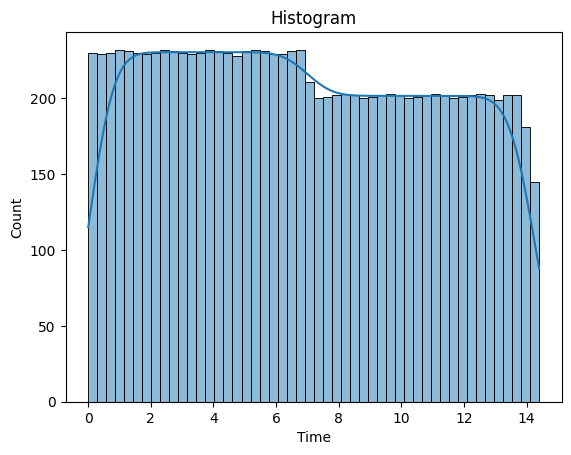

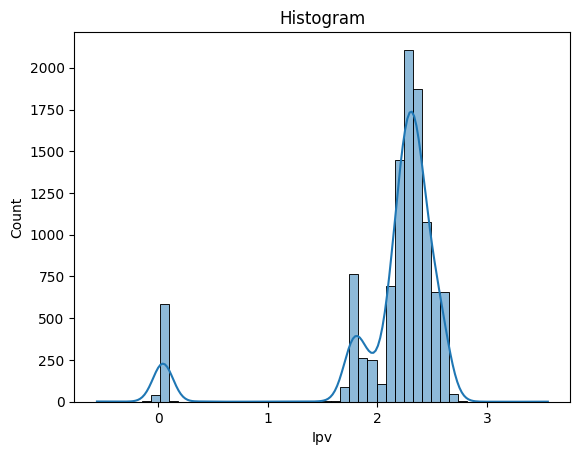

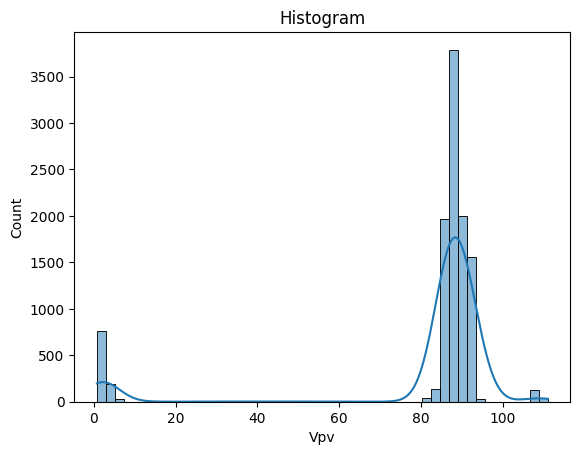

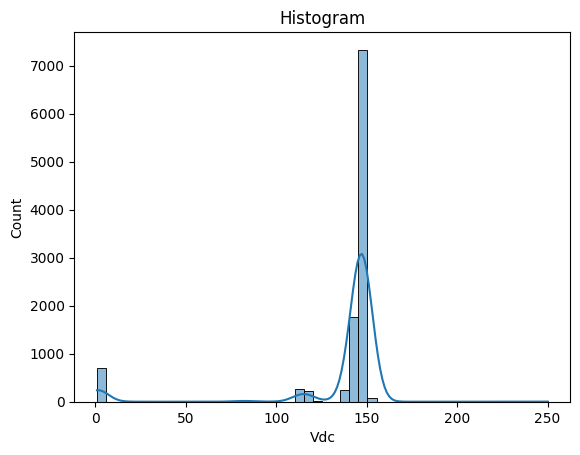

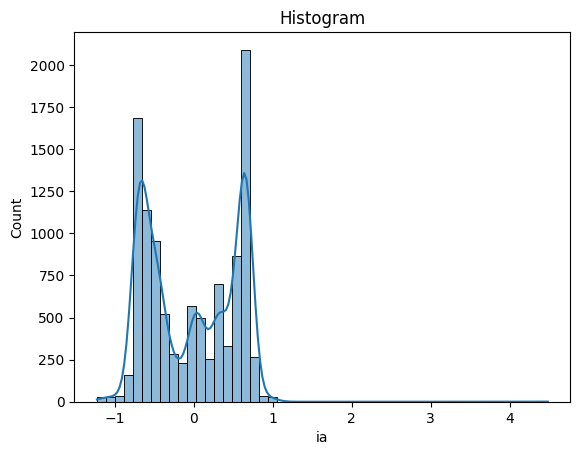

...

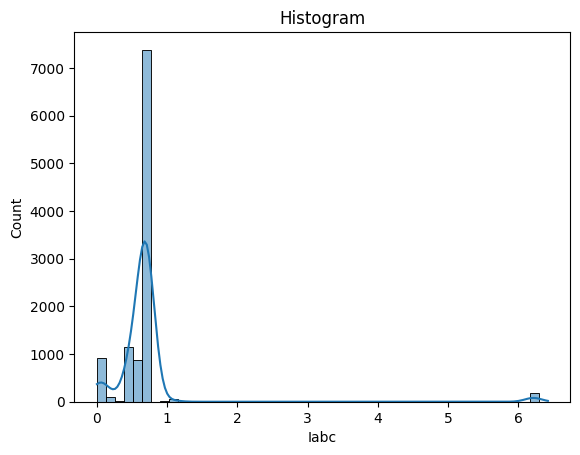

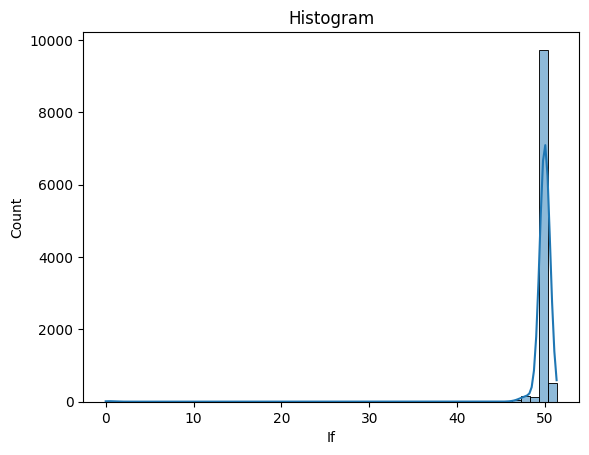

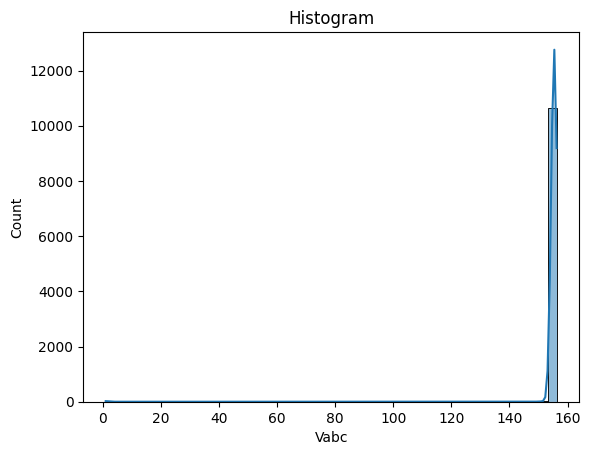

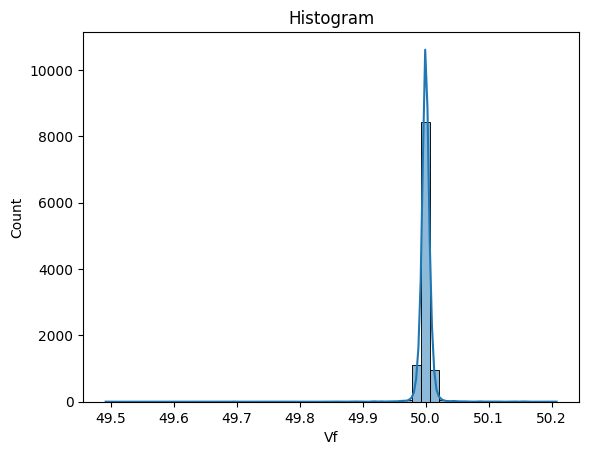

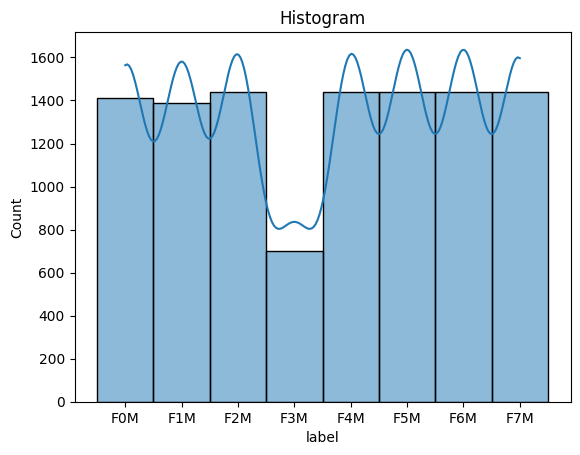

In [33]:
# Histogram for all columns

for i in solar:
    sns.histplot(solar[(i)], bins = 50, kde=True)
    plt.title("Histogram")
    plt.show()

## Count Plot

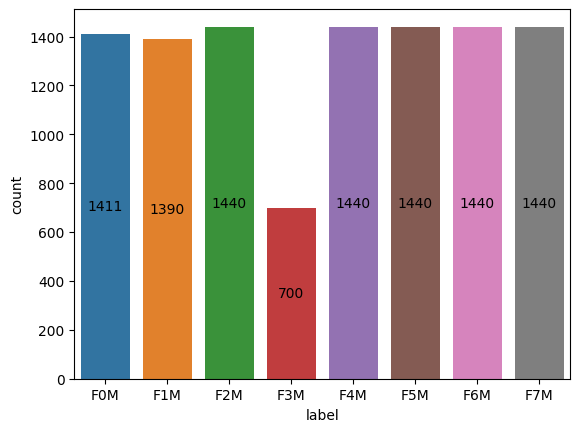

In [34]:
ax = sns.countplot(y['label'])
ax.bar_label(ax.containers[-1], fmt = "%.f", label_type = 'center')
plt.show()

#### We Observe that all the columns has equal proportional except 'F3M' which have only 700 observation.



## Box Plot

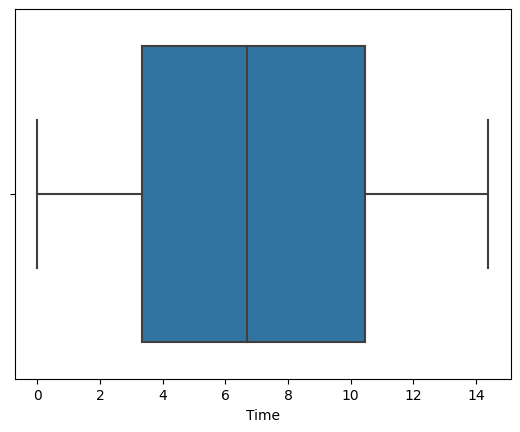

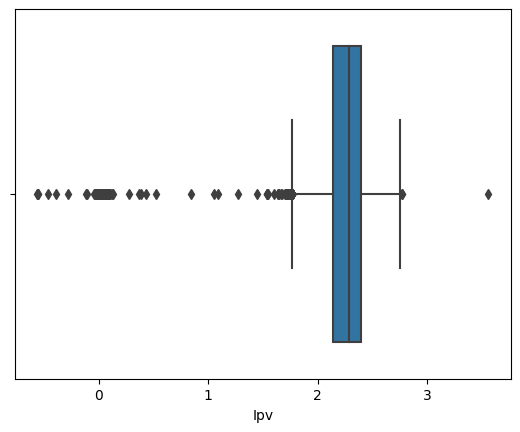

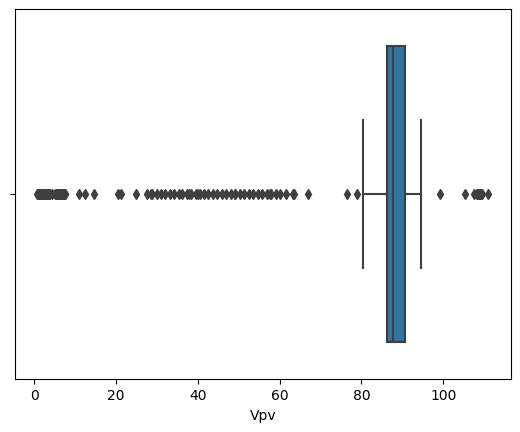

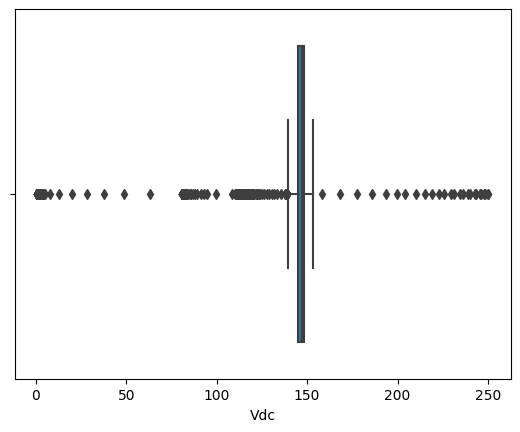

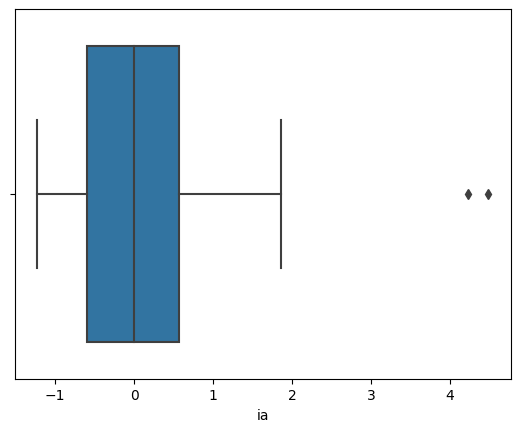

...

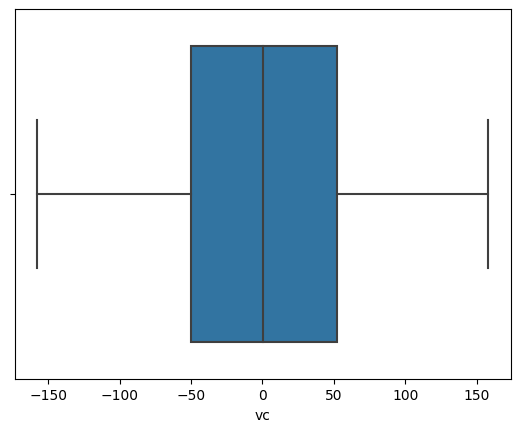

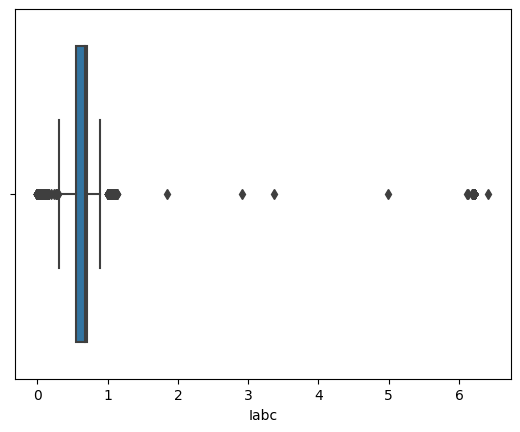

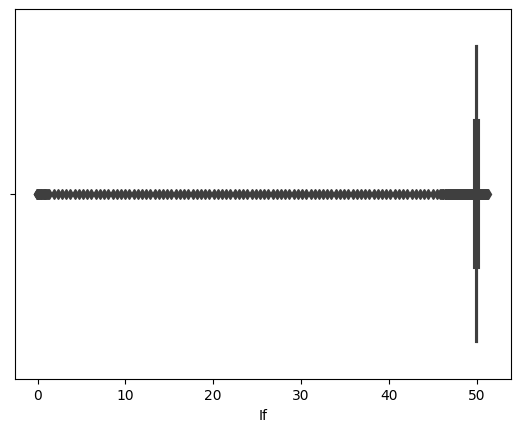

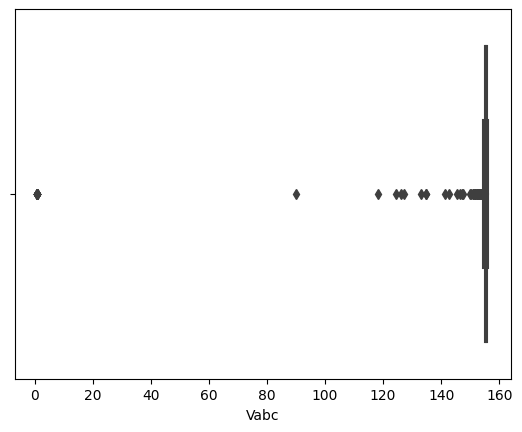

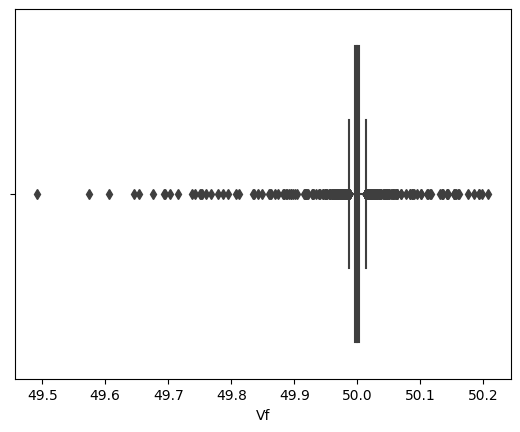

In [35]:
for i in X:
    sns.boxplot(X[i])
    plt.show()

# Checking for the Outliers

1. We can clearly seen that 'Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'Iabc', 'if', 'Vabc' and 'Vf' have Outliers.
2. We don't have outliers in 'Time', 'va', 'vb' and 'vc' attributes.

## Pair Plot

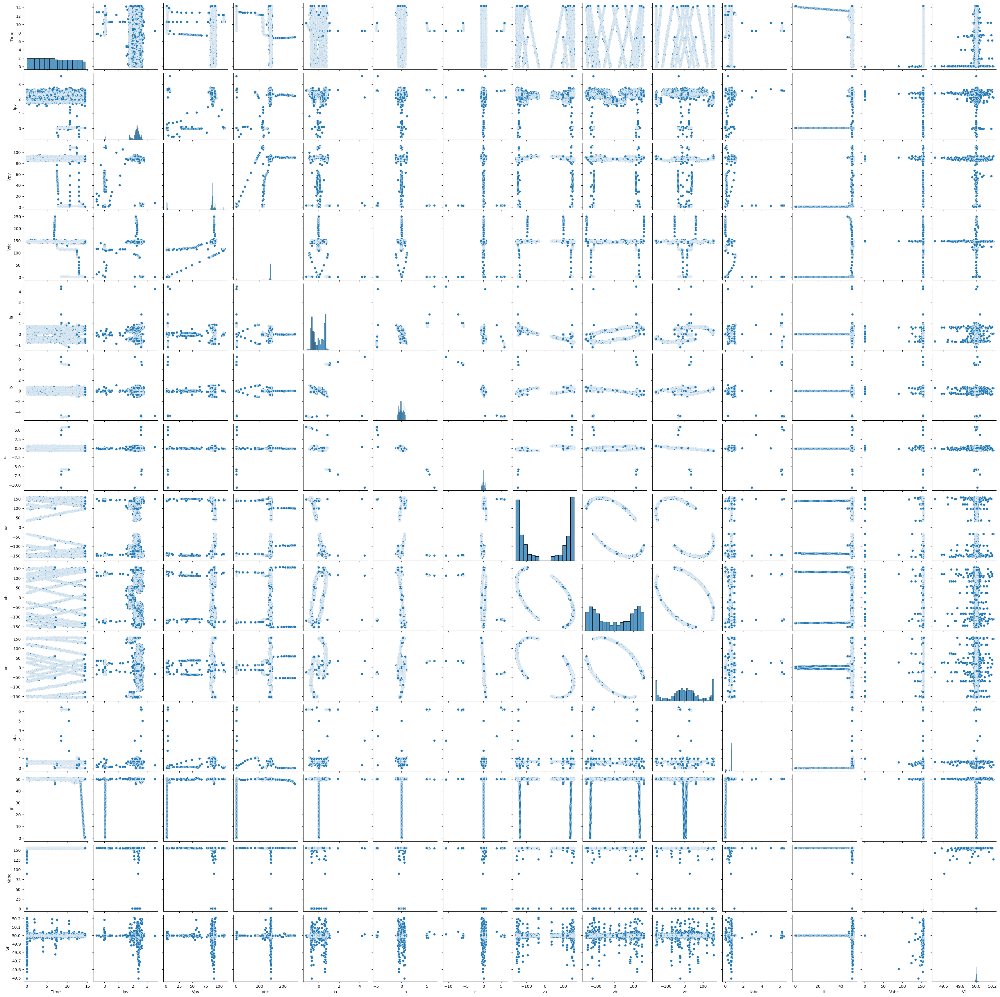

In [27]:
sns.pairplot(solar)

# 

# Normalizing the data using ( MinMaxScaler )

In [15]:
scale_pipeline = Pipeline([('scale', MinMaxScaler())])

In [16]:
scale_columntransfer = ColumnTransformer([('scale', scale_pipeline, X.columns)])

In [17]:
scale = scale_columntransfer.fit(X)

In [18]:
scale

ColumnTransformer(transformers=[('scale',
                                 Pipeline(steps=[('scale', MinMaxScaler())]),
                                 Index(['Time', 'Ipv', 'Vpv', 'Vdc', 'ia', 'ib', 'ic', 'va', 'vb', 'vc', 'Iabc',
       'If', 'Vabc', 'Vf'],
      dtype='object'))])

In [19]:
joblib.dump(scale, 'minmax') # Dumping MinMaxScaler pipeline

['minmax']

In [20]:
X_norm = pd.DataFrame(scale.fit_transform(X), columns = X.columns)

In [21]:
X_norm

,Time,Ipv,Vpv,Vdc,ia,ib,ic,va,vb,vc,Iabc,If,Vabc,Vf
0,0.000000,0.711693,0.813178,0.589894,0.322353,0.390973,0.635261,0.042165,0.882788,0.580199,0.155811,0.973807,0.000000,0.709370
1,0.000694,0.713761,0.812625,0.591069,0.095294,0.487104,0.647796,0.964554,0.115208,0.420882,0.155811,0.973807,0.000000,0.709370
2,0.001389,0.712612,0.813455,0.592244,0.320000,0.390387,0.633643,0.045223,0.882981,0.581828,0.155811,0.973807,0.000000,0.709370
3,0.002083,0.711463,0.813123,0.591069,0.094118,0.487104,0.647392,0.960779,0.115671,0.416506,0.068615,0.975335,0.755460,0.599693
4,0.002778,0.709855,0.813234,0.591069,0.324706,0.391559,0.634856,0.050696,0.884984,0.583634,0.096446,0.978648,0.573460,0.159518
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10696,0.996914,0.710085,0.784607,0.578143,0.309412,0.374560,0.654670,0.107206,0.955535,0.441313,0.109102,0.970647,0.994737,0.706126
10697,0.997609,0.696761,0.779679,0.579318,0.103529,0.488863,0.644561,0.894266,0.044118,0.557745,0.108558,0.973398,0.994668,0.709717
10698,0.998303,0.704801,0.783001,0.579318,0.308235,0.375147,0.655075,0.108716,0.955150,0.441937,0.107841,0.978081,0.994417,0.710044
10699,0.998998,0.725477,0.782171,0.579318,0.104706,0.488277,0.644966,0.892190,0.041151,0.557351,0.107578,0.976016,0.994372,0.709346
